In [33]:
# 필요한 패키지 설치
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import datetime
plt.rcParams['figure.dpi'] = 150

# 데이터 로드
data = pd.read_csv('Indian_Summers_Over_the_years.csv')

In [34]:
# 데이터 살펴보기
data.head()

,City,Date,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,windspeed,winddir,sealevelpressure,cloudcover,visibility,sunrise,sunset,moonphase,conditions,description
0,New Delhi,2021-04-01,34.0,19.0,27.1,31.6,19.0,26.1,3.1,22.60,22.8,272.9,1002.8,0.0,3.1,2021-04-01 06:11:12,2021-04-01 18:39:13,0.60,Clear,Clear conditions throughout the day.
1,New Delhi,2021-04-02,33.9,16.0,25.8,31.8,16.0,24.9,4.5,27.62,12.4,275.0,1006.2,0.0,3.5,2021-04-02 06:10:04,2021-04-02 18:39:46,0.65,Clear,Clear conditions throughout the day.
2,New Delhi,2021-04-03,34.8,14.6,26.0,32.2,14.6,25.1,1.3,23.18,16.5,127.5,1008.8,1.4,3.5,2021-04-03 06:08:55,2021-04-03 18:40:19,0.70,Clear,Clear conditions throughout the day.
3,New Delhi,2021-04-04,36.8,16.9,27.1,34.2,16.9,26.0,4.8,28.00,18.3,157.6,1009.5,2.6,3.2,2021-04-04 06:07:47,2021-04-04 18:40:53,0.76,Clear,Clear conditions throughout the day.
4,New Delhi,2021-04-05,38.8,21.0,29.9,37.1,21.0,28.9,8.1,28.85,13.5,100.4,1007.8,38.4,3.1,2021-04-05 06:06:39,2021-04-05 18:41:26,0.81,Partially cloudy,Partly cloudy throughout the day.


In [79]:
# 데이터 살펴보기
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13650 entries, 0 to 13649
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   City              13650 non-null  object        
 1   Date              13650 non-null  datetime64[ns]
 2   tempmax           13615 non-null  float64       
 3   tempmin           13615 non-null  float64       
 4   temp              13605 non-null  float64       
 5   feelslikemax      13614 non-null  float64       
 6   feelslikemin      13614 non-null  float64       
 7   feelslike         13604 non-null  float64       
 8   dew               13605 non-null  float64       
 9   humidity          13605 non-null  float64       
 10  windspeed         13605 non-null  float64       
 11  winddir           13600 non-null  float64       
 12  sealevelpressure  10631 non-null  float64       
 13  cloudcover        13605 non-null  float64       
 14  visibility        1360

 데이터 설명
 --------------
- City - 인도의 도시 이름
- Date - 날짜
- tempmax - 최고 온도
- tempmin - 최소 온도
- temp - 가장 길었던 온도(평균 온도)
- feelslikemax - 체감 최고 온도
- feelslikemin - 체감 최저 온도
- feelslike - 최감 가장 길었던 온도(최감 평균 온도)
- dew - 이슬점
- humidity - 습도
- windspeed - 풍속(km/hr)
- winddir - 풍향
- sealevelpressure - 해면기압(평균 해수면 높이에서의 기압)
- cloudcover - 운량(구름이 하늘을 덮고 있는 정도)
- visibility - 가시성
- sunrise - 일출 시간
- sunset - 일몰 시간
- moonphase - 달의 위상
- conditions - 날씨
- description - 날씨 설명

# 시간 시각화

## 년도별 평균 기온

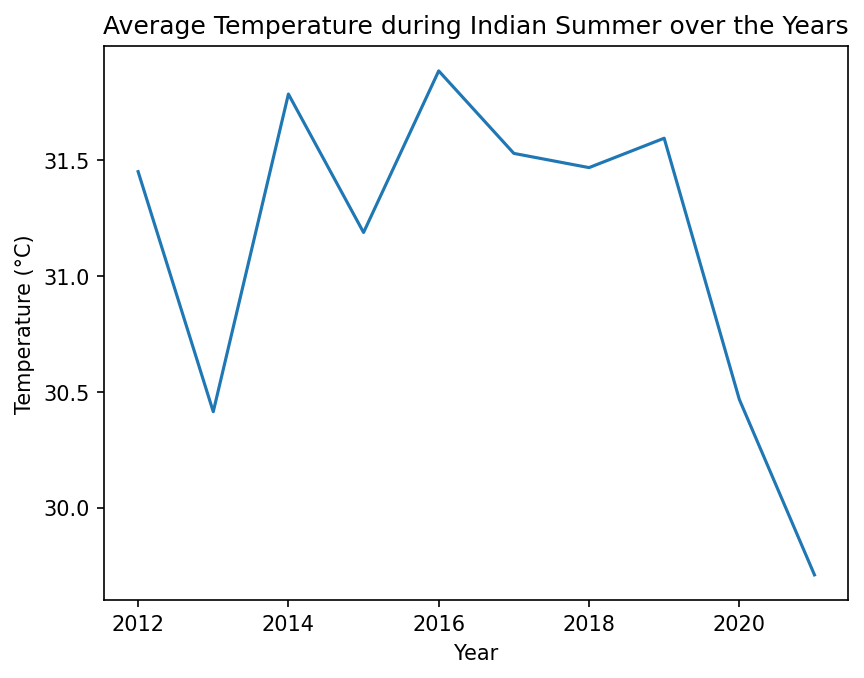

In [46]:
# 시간 변수 생성
data['Date'] = pd.to_datetime(data['Date'])

# 연도별 평균 기온 계산
mean_temp_by_year = data.groupby(data['Date'].dt.year)['temp'].mean()

# 그래프 그리기
plt.plot(mean_temp_by_year.index, mean_temp_by_year.values)
plt.title('Average Temperature during Indian Summer over the Years')
plt.xlabel('Year')
plt.ylabel('Temperature (°C)')
plt.show()

- 위 그래프를 보면 2021년이 30도 밑으로 기온이 가장 낮고 2016년이 31.5도 이상으로 가장 높은 것을 알 수 있음
- 2019년 이후로 감소하는 추세를 보임 

## 최고온도, 최저온도를 포함한 년도별 평균 기온

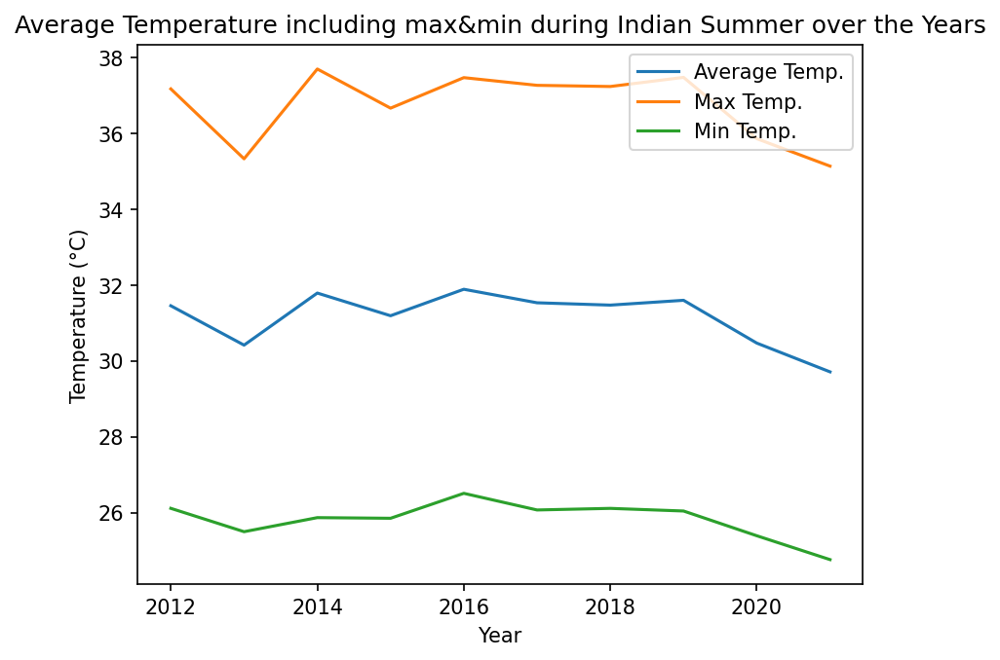

In [52]:
# 시간 변수 생성
data['Date'] = pd.to_datetime(data['Date'])

# 연도별 평균 기온 계산
mean_temp_by_year = data.groupby(data['Date'].dt.year)['temp'].mean()
mean_tempmax_by_year = data.groupby(data['Date'].dt.year)['tempmax'].mean()
mean_tempmin_by_year = data.groupby(data['Date'].dt.year)['tempmin'].mean()

# 그래프 그리기
plt.plot(mean_temp_by_year.index, mean_temp_by_year.values, label='Average Temp.')
plt.plot(mean_tempmax_by_year.index, mean_tempmax_by_year.values, label='Max Temp.')
plt.plot(mean_tempmin_by_year.index, mean_tempmin_by_year.values, label='Min Temp.')
plt.legend(loc='best')
plt.title('Average Temperature including max&min during Indian Summer over the Years')
plt.xlabel('Year')
plt.ylabel('Temperature (°C)')
plt.show()

- 최고온도, 평균온도, 최저온도 모두 비슷한 양상을 띄고 있음
- 최고 온도는 35°C 이상, 평균온도는 30°C~32°C 사이 최저온도는 27°C 이하를 띄고있음
- 일교차는 항상 10°C 차이 이하를 유지중 

# 관계 시각화

## 데이터의 Pairplot 출력

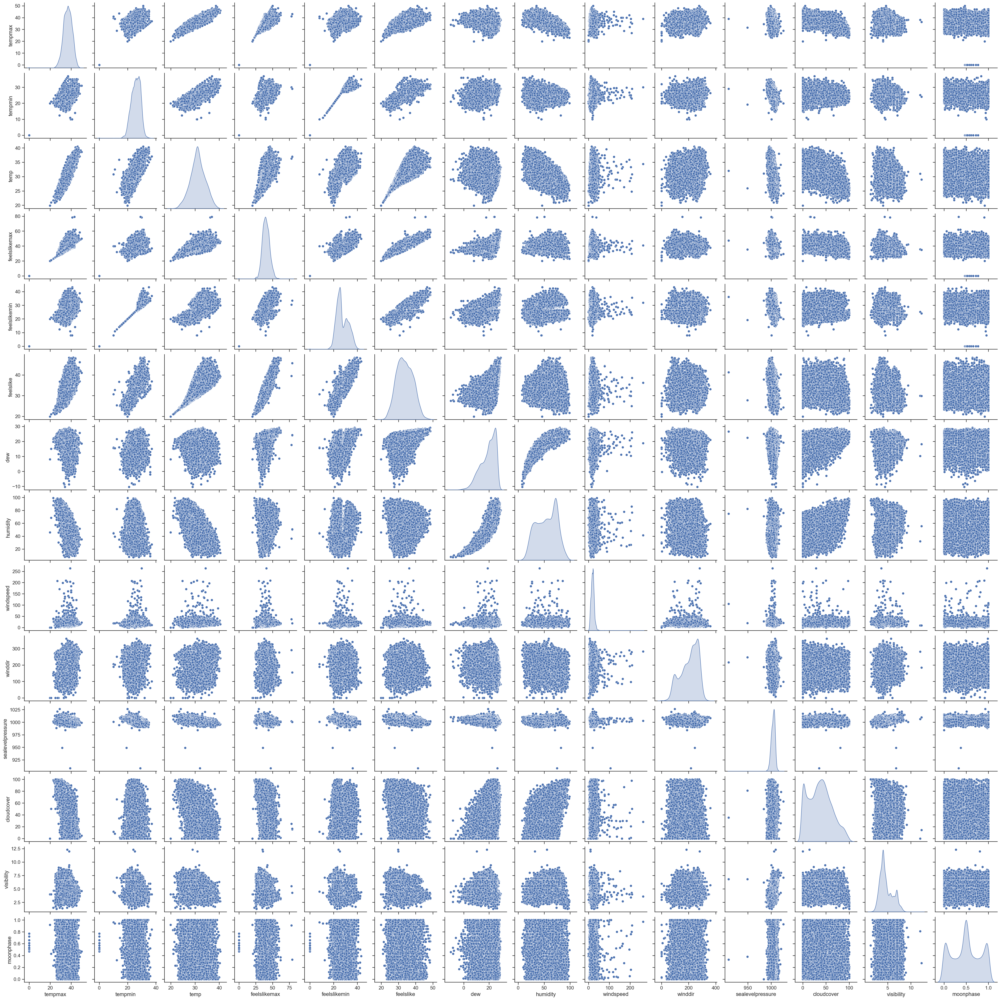

In [53]:
sns.set(font_scale=1.1) ## 폰트 크기 설정
sns.set_style('ticks') ## 축 눈금 설정
sns.pairplot(data,
             diag_kind='kde' # 상관계수가 1이면 분포로 표시
            )
plt.show()

- 어느정도 상관성이 보이는 것은 있지만 아예 상관이 없는 데이터도 보임

## 데이터 히트맵 출력

/var/folders/1q/v9gxtgcn3bl6qw0ln1qykht40000gp/T/ipykernel_61134/699239917.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.clustermap(data.corr(),


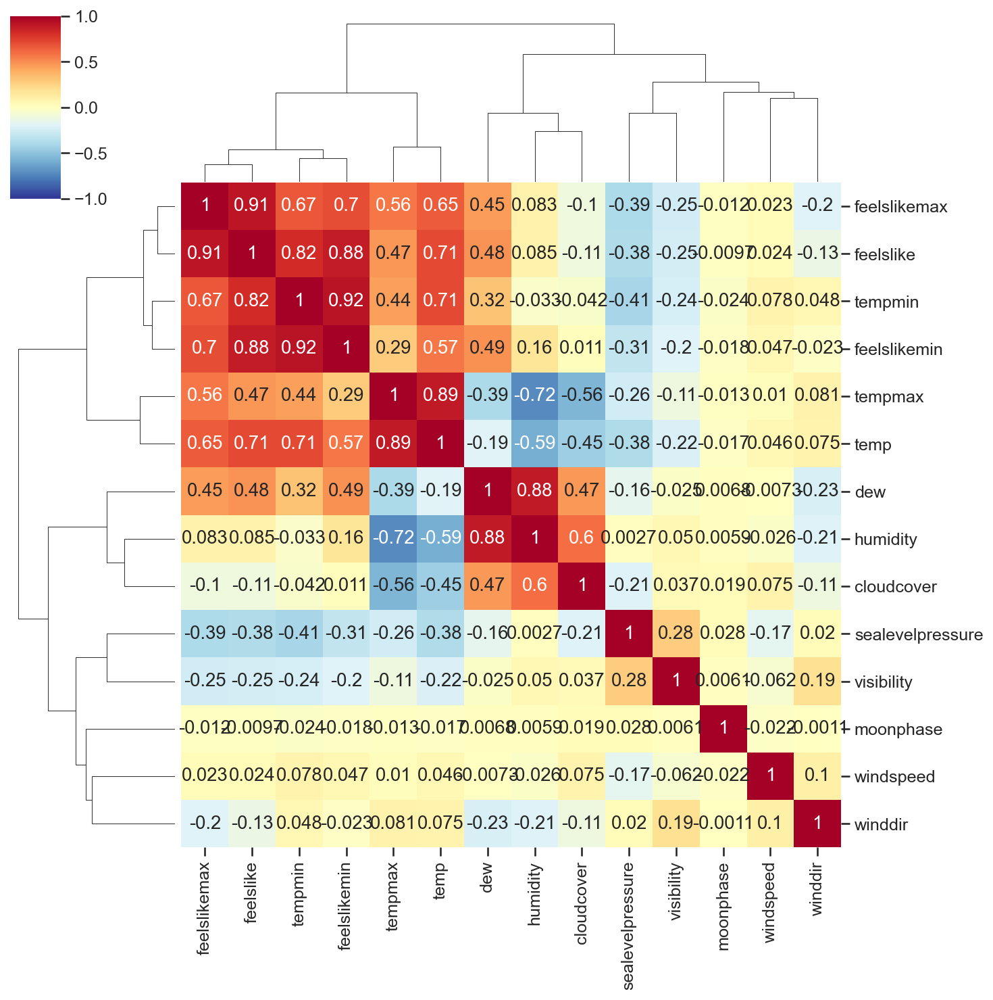

In [54]:
# 히트맵 시각화
sns.clustermap(data.corr(), 
               annot = True,      
               cmap = 'RdYlBu_r',  
               vmin = -1, vmax = 1,
              )

- 온도와 관련된 feelslikemax, feelslike, feelslikemin, tempmin, tempmax, temp는 서로서로 상관성이 높음
- 이슬점은 습도와 연관성이 높음
- 운량은 이슬점과 습도와 어느정도 연관성이 있음
- 습도는 최고온도와 상극관계
- 풍속과 풍향은 어느정도 연관성이 있을 줄 알았지만 상관성이 미미함

## 이슬점와 습도의 상관관계

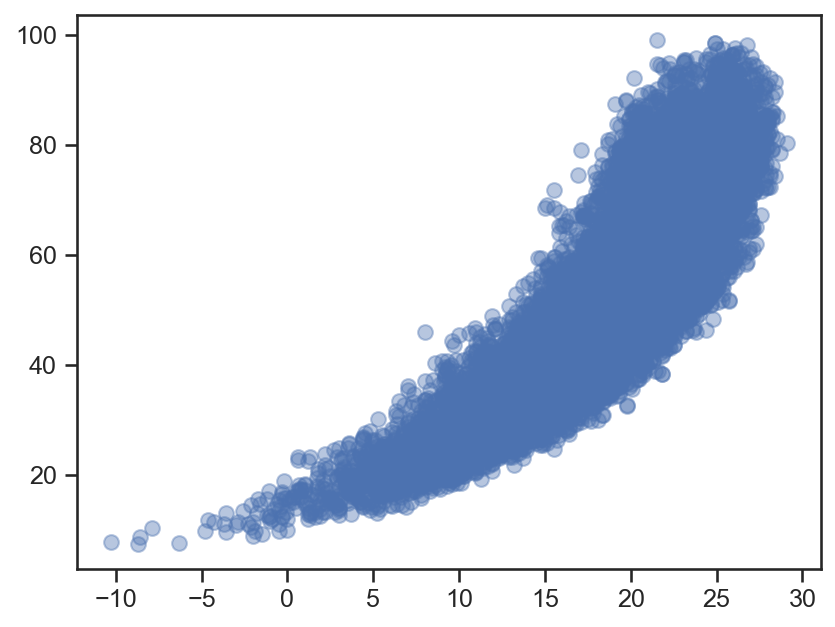

In [61]:
plt.scatter(data['dew'], data['humidity'], s = 50, alpha = 0.4)
plt.show()

- 그래프가 우상향 그래프임(상관계수가 1에 가까움)
- 이슬점과 습도는 매우 연관관계가 높은 것을 알 수 있음

# 분포 시각화

## 도시 별 온도 시각화

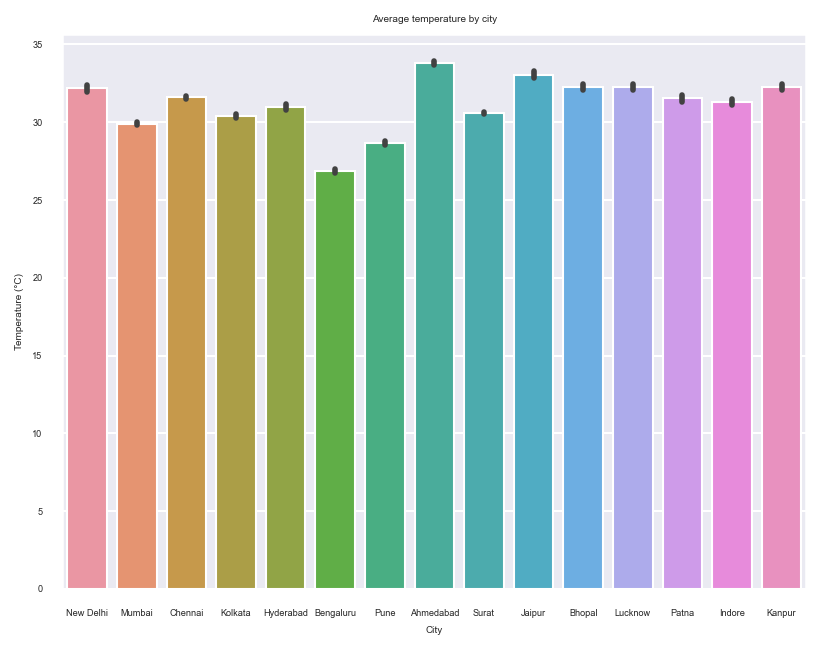

In [80]:
# 도시 별 온도 bar plot 시각화

sns.barplot(x="City", y="temp", data=data)
sns.set(font_scale=0.4)
plt.xlabel('City')
plt.ylabel('Temperature (°C)')
plt.title("Average temperature by city")
plt.show()

- Bengaluru 도시가 가장 기온이 낮고 Ahmedabad 도시가 가장 기온이 높은 것을 확인 할 수 있음
- Bengaluru, Pune 도시를 제외하고는 모두 30°C 이상 띄는 양상
- 인도의 Bengaluru 도시는 해발 920m의 서늘한 고원지대에 위치해 있기 때문에 기온이 낮은 것 같다고 추측
- 인도의 Pune 도시도 해발 600m로 고원지대에 위치해있음

## Pie 그래프로 날씨의 분포도 시각화 

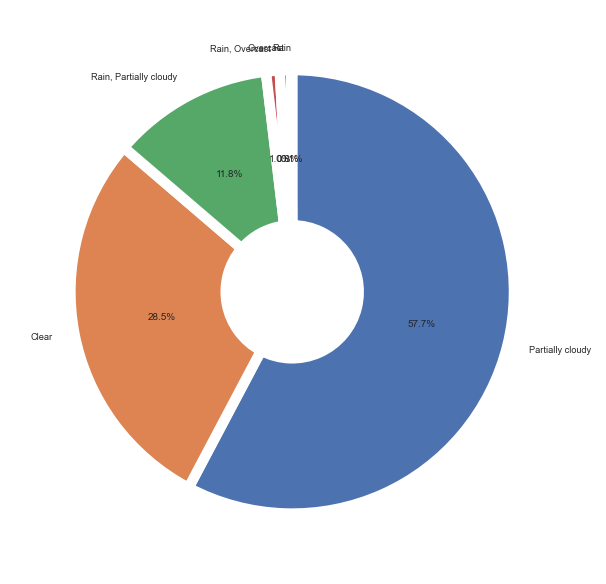

In [87]:
# conditions 컬럼의 분포도 구하기
conditions_counts = data['conditions'].value_counts()

# 차트 형태 옵션 설정
wedgeprops={'width': 0.7, 'edgecolor': 'w', 'linewidth': 5}

# pie 그래프 시각화
plt.pie(conditions_counts.values, labels=conditions_counts.index, autopct='%.1f%%', 
        startangle=90, counterclock=False, wedgeprops=wedgeprops)
plt.show()

- 부분적으로 구름이 껴있는 날이 57.7%로 대부분
- 맑은날은 28.5%
- 비를 포함한 나머지는 13.8%로 상대적으로 적음